# High Value Customer Identification (Insiders)

## 0.0. Planejamento da Solução

### Input - Entrada

1. Problema de Negócio
   - Selecionar os clientes mais valiosos para integrar um programa de Fidelização

--------------------------------------------------------------     
2. Conjunto de dados
   - Vendas de um e-commerce online, durante o periodo de um ano.

### Output - Saída

1. A indicação das pessoas que farão parte do programa de Insiders
    - Lista: client_id | is_insider |
    -          10323    | yes / 1
    -          32413    | no / 2

---------------------------------------------------------------
2. Relatório com as respostas das perguntas de negócio
    - Quem são as pessoas elegíveis para participar do programa de Insiders?
    - Quantos clientes farão parte do grupo?
    - Quais as principais características desses clientes?
    - Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Qual a expectativa de faturamento desse grupo para os próximos meses?
    - Quais as condições para uma pessoa ser elegível ao Insiders?
    - Quais as condições para uma pessoa ser removida do Insiders?
    - Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Quais ações o time de marketing pode realizar para aumentar o faturamento?

### Task - Tarefas

1. Quem são as pessoas elegíveis para participar do programa de Insiders?
    - O que é ser elegível? O que são clientes de maior 'valor'?
        - Faturamento:
          - Alto Ticket médio.
          - Alto LTV.
          - Baixo Recência. (Sempre esta comprando ou utilizando o produto)
          - Alto Basket Size.
          - Baixo probabilidade de Churn.
          - Alta previsão de LTV.
          - Alta propensão de compra.

        - Custo:
          - Baixa taxa de devolução.

        - Experiência de compra:
          - Média alta das avaliação.

------------------------------------------------------
2. Quantos clientes farão parte do grupo?
    - Número total de clientes.
    - % do grupo Insiders.

------------------------------------------------------
3. Quais as principais características desses clientes?
    - Escrever características do cliente:
        - Idade.
        - Localização.
        - Sexo.
        - Estado Cívil.

    - Escrever características do consumo:
        - Atributos da clusterização.

------------------------------------------------------
4. Qual a porcentagem de contribuição do faturamento, vinda do Insiders?
    - Faturamento total do ano.
    - Faturamento do grupo Insiders.

------------------------------------------------------
5. Qual a expectativa de faturamento desse grupo para os próximos meses?
    - LTV do grupo Insiders.
    - Análise de Cohort

------------------------------------------------------
6. Quais as condições para uma pessoa ser elegível ao Insiders?
    - Definir a periodicidade. 
    - A pessoa precisa ser similar ou parecido com uma pessoa do grupo.

------------------------------------------------------
7. Quais as condições para uma pessoa ser removida do Insiders?
    - Definir a periodicidade.
    - A pessoa precisa ser desimilar ou não-parecido com uma pessoa do grupo

------------------------------------------------------
8. Qual a garantia que o programa Insiders é melhor que o restante da base?
    - Teste A/B.
    - Teste A/B Bayesiano
    - Teste de hipóteses.

------------------------------------------------------
9. Quais ações o time de marketing pode realizar para aumentar o faturamento?
    - Desconto.
    - Preferência de compra.
    - Produtos exclusivos.
    - Visita a empresa.

# <font color='blue'>0.0. Imports</font>

In [1]:
import numpy    as np
import pandas   as pd
import seaborn  as sns
import inflection
import warnings

import umap.umap_ as umap

from matplotlib import pyplot as plt
from IPython.display import HTML
from plotly import express as px

from pandas_profiling import ProfileReport

from sklearn import cluster as c
from sklearn import metrics as m
from sklearn import preprocessing as pp
from sklearn import decomposition as dd
from sklearn import ensemble as en
from sklearn import mixture as mx
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

from scipy.cluster import hierarchy as hc

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

warnings.filterwarnings( 'ignore' )

/tmp/ipykernel_5945/215901734.py:13: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


## <font color='blue'>0.1. Helper Functions</font>

In [2]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    
    plt.style.use( 'ggplot')
    plt.rcParams['figure.figsize'] = [24, 9]
    plt.rcParams['font.size'] = 24
    
    display( HTML( '<style>.container { width:100% !important; }</style>') )
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.set_option( 'display.expand_frame_repr', False )
    
    sns.set()
    
jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


## <font color='blue'>0.2. Load DataSet</font>

In [3]:
# load data
df_raw = pd.read_csv('../data/raw/Ecommerce.csv', encoding='unicode_escape')

# drop extra column
df_raw = df_raw.drop( columns=['Unnamed: 8'], axis=1)

In [4]:
df_raw.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


# <font color='red'>1.0. Descrição dos dados</font>

In [5]:
df1 = df_raw.copy()

## 1.1. Rename Columns

In [6]:
df1.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [7]:
cols_old = ['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country']

snakecase = lambda x: inflection.underscore( x )

cols_new = list( map (snakecase, cols_old) )

#Rename
df1.columns = cols_new

In [8]:
df1.columns

Index(['invoice_no', 'stock_code', 'description', 'quantity', 'invoice_date',
       'unit_price', 'customer_id', 'country'],
      dtype='object')

## 1.2. Data Dimensions

In [9]:
print(f'Numero de Linhas: {df1.shape[0]}')
print(f'Numero de Colunas: {df1.shape[1]}')

Numero de Linhas: 541909
Numero de Colunas: 8


## 1.3. Data Types

In [10]:
df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,29-Nov-16,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,29-Nov-16,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,29-Nov-16,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,29-Nov-16,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,29-Nov-16,3.39,17850.0,United Kingdom


In [11]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
customer_id     float64
country          object
dtype: object

## 1.4. Check NA

In [12]:
df1.isna().sum()

invoice_no           0
stock_code           0
description       1454
quantity             0
invoice_date         0
unit_price           0
customer_id     135080
country              0
dtype: int64

## 1.5. Replace NA

In [13]:
df_missing = df1.loc[df1['customer_id'].isna(), :]
df_not_missing = df1.loc[~df1['customer_id'].isna(), :]

In [14]:
print(f'Customer NA: {df_missing.shape[0]}')
print(f'Customer Ok: {df_not_missing.shape[0]}')

Customer NA: 135080
Customer Ok: 406829


In [15]:
# Separando em uma lista os invoice sem o customer registrado
missing_invoice = df_missing['invoice_no'].drop_duplicates().tolist()
missing_invoice[0:10]

['536414',
 '536544',
 '536545',
 '536546',
 '536547',
 '536549',
 '536550',
 '536552',
 '536553',
 '536554']

In [16]:
# Conferindo se algum invoice que o customer não está registrado, consta no dataframe com os customer ok
df_not_missing.loc[df_not_missing['invoice_no'].isin( missing_invoice ),:].head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,customer_id,country


**Conclusão:** Não temos invoice repetido na base onde um tenha o customer id e outro não. Dessa forma não conseguimos preencher os NA's com essa estratégia.

In [17]:
# Criar id's acima do valor maximo do customer id, para conseguir usar os 25% da base que está como NA na clusterização

# create reference
df_backup = pd.DataFrame( df_missing['invoice_no'].drop_duplicates() )
df_backup['customer_id'] = np.arange(19000, 19000 + len( df_backup ), 1 )

# merge original with reference dataframe
df1 = pd.merge( df1, df_backup, on='invoice_no', how='left')

# coalese
df1['customer_id'] = df1['customer_id_x'].combine_first( df1['customer_id_y'] )

# drop extra columns
df1 = df1.drop( columns=['customer_id_x', 'customer_id_y'], axis=1 )

In [18]:
df1.isna().sum()

invoice_no         0
stock_code         0
description     1454
quantity           0
invoice_date       0
unit_price         0
country            0
customer_id        0
dtype: int64

## 1.6. Change Dtypes

In [19]:
df1.dtypes

invoice_no       object
stock_code       object
description      object
quantity          int64
invoice_date     object
unit_price      float64
country          object
customer_id     float64
dtype: object

In [20]:
# invoice_date
df1['invoice_date'] = pd.to_datetime( df1['invoice_date'], format='%d-%b-%y' )

# customer_id
df1['customer_id'] =df1['customer_id'].astype( int ) 

df1.head()

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,United Kingdom,17850


In [21]:
df1.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
country                 object
customer_id              int64
dtype: object

## 1.7. Descriptive Statistics

In [22]:
num_attributes = df1.select_dtypes( include=['int64', 'float64'] )
cat_attributes = df1.select_dtypes( exclude=['int64', 'float64', 'datetime64[ns]'] )


### 1.7.1 Numerical Attributes

In [23]:
# central tendency - mean, median
ct1 = pd.DataFrame( num_attributes.apply( np.mean ) ).T
ct2 = pd.DataFrame( num_attributes.apply( np.median ) ).T

# dispersion - desvio padrão, minímo, maximo, range, skew, kurtosis
d1 = pd.DataFrame( num_attributes.apply( np.std ) ).T
d2 = pd.DataFrame( num_attributes.apply( np.min ) ).T
d3 = pd.DataFrame( num_attributes.apply( np.max ) ).T
d4 = pd.DataFrame( num_attributes.apply( lambda x: x.max() - x.min()  ) ).T
d5 = pd.DataFrame( num_attributes.apply( lambda x: x.skew() ) ).T
d6 = pd.DataFrame( num_attributes.apply( lambda x: x.kurtosis() ) ).T

# concatenate
metricas = pd.concat( [d2, d3, d4, ct1, ct2, d1, d5, d6]).T.reset_index()
metricas.columns=['attributes','Min', 'Max', 'Range', 'Mean', 'Mediana', 'Desvio Padrão', 'Skew', 'Kurtosis']
metricas

,attributes,Min,Max,Range,Mean,Mediana,Desvio Padrão,Skew,Kurtosis
0,quantity,-80995.00,80995.0,161990.00,9.552250,3.00,218.080957,-0.264076,119769.160031
1,unit_price,-11062.06,38970.0,50032.06,4.611114,2.08,96.759764,186.506972,59005.719097
2,customer_id,12346.00,22709.0,10363.00,16688.840453,16249.00,2911.408666,0.487449,-0.804287


### <font color='red'> 1.7.1.1 Numerical Attributes - Investigação</font>

1. Quantity Negativa ( pode ser devolução )
2. Preço unitário (unit_price) igaul a zero ( promoção? )

### 1.7.2 Categorical Attributes

#### Invoice No

In [24]:
# prblema: temos invoice com letras e números

# identificação:
df_letter_invoce = df1.loc[df1['invoice_no'].apply( lambda x: bool( re.search( '[^0-9]+', x) ) ), : ]
df_letter_invoce.head()

# qt invoice com letras
print(f'Total de invoice com letras: {len(df_letter_invoce)}')

# qt de linhas com a coluna 'quantity' negativa
print(f'Total de linhas com a quantity negativa: {len( df_letter_invoce[df_letter_invoce["quantity"] < 0 ] )}')

Total de invoice com letras: 9291
Total de linhas com a quantity negativa: 9288


#### Stock Code

In [25]:
# prblema: temos Stock Code com letras e números

# identificação:tock_code - apenas strings
df1.loc[df1['stock_code'].apply( lambda x: bool( re.search( '^[a-zA-Z]+$', x) ) ), 'stock_code'].unique()

# Remover stock_code in ['POST', 'D', 'M', 'PADS', 'DOT', 'CRUK']

array(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY',
       'DCGSSGIRL', 'PADS', 'B', 'CRUK'], dtype=object)

#### Description

In [26]:
df1.head()

# Deletar a coluna description

,invoice_no,stock_code,description,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,WHITE METAL LANTERN,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2016-11-29,3.39,United Kingdom,17850


#### Country

In [27]:
# Paises únicos na base
df1['country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Bahrain', 'Greece', 'Hong Kong', 'Singapore',
       'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Unspecified', 'Brazil', 'USA',
       'European Community', 'Malta', 'RSA'], dtype=object)

In [28]:
# % de paises na base
df1['country'].value_counts(normalize=True).head()

country
United Kingdom    0.914320
Germany           0.017521
France            0.015790
EIRE              0.015124
Spain             0.004674
Name: proportion, dtype: float64

In [29]:
# Qt customer por pais
df1[['customer_id', 'country']].drop_duplicates().groupby( 'country' ).count().reset_index().sort_values( 'customer_id', ascending=False ).head()

,country,customer_id
36,United Kingdom,7587
14,Germany,95
13,France,90
10,EIRE,44
31,Spain,31


# <font color='red'>2.0. Filtragem de Variáveis</font>

In [30]:
df2 = df1.copy()

In [31]:
df2.dtypes

invoice_no              object
stock_code              object
description             object
quantity                 int64
invoice_date    datetime64[ns]
unit_price             float64
country                 object
customer_id              int64
dtype: object

In [32]:
# ==== Numerical Attributes ====
# unit price > 0.0
df2 = df2.loc[df2['unit_price'] > 0.04, :]

# === Categorical Attributes ====
# stock code != ['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL', 'PADS', 'B', 'CRUK']
df2 = df2[~df2['stock_code'].isin(['POST', 'D', 'DOT', 'M', 'S', 'AMAZONFEE', 'm', 'DCGSSBOY', 'DCGSSGIRL', 'PADS', 'B', 'CRUK'] )]

# description
df2 = df2.drop( columns='description', axis=1 )

# country - exclusão das linhas (RISCO)
df2 = df2 [~df2['country'].isin ( ['European Community', 'Unspecified' ] ) ]

#bad users
df2 = df2[~df2['customer_id'].isin([16446]) ]


# quantity - Negative number (devolução de produto) - Efetuado a separação do dataframe entre os produtos vendidos e os devolvidos
df2_returns = df2.loc[df2['quantity'] < 0, :]
df2_purchase = df2.loc[df2['quantity'] > 0, :]


# <font color='red'>3.0. Feature Engineering</font>

In [33]:
df3 = df2.copy()

## 3.1. Feature Creation

In [34]:
df3.head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
0,536365,85123A,6,2016-11-29,2.55,United Kingdom,17850
1,536365,71053,6,2016-11-29,3.39,United Kingdom,17850
2,536365,84406B,8,2016-11-29,2.75,United Kingdom,17850
3,536365,84029G,6,2016-11-29,3.39,United Kingdom,17850
4,536365,84029E,6,2016-11-29,3.39,United Kingdom,17850


In [35]:
# data reference
df_ref = df3.drop( ['invoice_no', 'stock_code', 'quantity', 'invoice_date', 'unit_price', 
                    'country'], axis=1 ).drop_duplicates( ignore_index=True)

### 3.1.1. Gross Revenue

In [36]:
# Gross Revenue (Faturamento) quantity * price
df2_purchase['gross_revenue'] = df2_purchase['quantity'] * df2_purchase['unit_price']

# Monetary
df_monetary = df2_purchase[['customer_id', 'gross_revenue']].groupby('customer_id').sum().reset_index()
df_ref = pd.merge( df_ref, df_monetary, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
dtype: int64

### 3.1.2. Recency - Day from last purchase

In [37]:
# Recency - ultimo dia de compra
df_recency = df2_purchase[['customer_id', 'invoice_date']].groupby('customer_id').max().reset_index()
df_recency['recency_days'] = ( df2_purchase['invoice_date'].max() - df_recency['invoice_date'] ).dt.days
df_recency = df_recency[['customer_id', 'recency_days']].copy()
df_ref = pd.merge( df_ref, df_recency, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
dtype: int64

### 3.1.3. Quantity of purchased

In [38]:
# Numero de produtos
df_freq = (df2_purchase[['customer_id', 'invoice_no']].drop_duplicates()
                                                      .groupby('customer_id')
                                                      .count()
                                                      .reset_index()
                                                      .rename( columns={'invoice_no': 'qte_invoices'}))
df_ref = pd.merge( df_ref, df_freq, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
dtype: int64

### 3.1.4. Quantity of items purchased

In [39]:
# Numero de produtos
df_freq_prod = (df2_purchase[['customer_id', 'quantity']].groupby('customer_id')
                                                         .sum()
                                                         .reset_index()
                                                         .rename( columns={'quantity': 'qte_items'}) )
df_ref = pd.merge( df_ref, df_freq_prod, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
dtype: int64

### 3.1.5. Quantity of produtcs purchased

In [40]:
# Numero de produtos
df_freq_prod = (df2_purchase[['customer_id', 'stock_code']].groupby('customer_id')
                                                           .count()
                                                           .reset_index()
                                                           .rename( columns={'stock_code': 'qtde_produtcs'}) )
df_ref = pd.merge( df_ref, df_freq_prod, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
qtde_produtcs    91
dtype: int64

### 3.1.6. Average Ticket Value

In [41]:
# AVG Ticket
df_avg_ticket = df2_purchase[['customer_id', 'gross_revenue']].groupby('customer_id').mean().reset_index().rename( columns={'gross_revenue': 'avg_ticket'})
df_ref = pd.merge( df_ref, df_avg_ticket, on='customer_id', how='left')
df_ref.isna().sum()

customer_id       0
gross_revenue    91
recency_days     91
qte_invoices     91
qte_items        91
qtde_produtcs    91
avg_ticket       91
dtype: int64

### 3.1.7. Average Recency Days

In [42]:
# Average recency days
df_aux = df2_purchase[['customer_id', 'invoice_date']].drop_duplicates().sort_values( ['customer_id', 'invoice_date'], ascending=[True , True] )
df_aux['next_customer_id'] = df_aux['customer_id'].shift() # next customer
df_aux['previous_date'] = df_aux['invoice_date'].shift() # next invoince date

df_aux['avg_recency_days'] = df_aux.apply( lambda x: ( x['invoice_date'] - x['previous_date'] ).days if x['customer_id'] == x['next_customer_id'] else np.nan, axis=1 )

df_aux = df_aux.drop( ['invoice_date', 'next_customer_id', 'previous_date'], axis=1 ).dropna()

# averagerecency
df_avg_recency_days = df_aux.groupby('customer_id' ).mean().reset_index()

# merge
df_ref = pd.merge( df_ref, df_avg_recency_days, on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
dtype: int64

### 3.1.8. Frequency Purchase

In [43]:
df_aux = ( df2_purchase[['invoice_no', 'customer_id', 'invoice_date']].drop_duplicates()
                                                             .groupby( 'customer_id')
                                                             .agg( max_ = ('invoice_date', 'max'),
                                                                   min_ = ('invoice_date', 'min'),
                                                                   days_= ('invoice_date', lambda x: ( (x.max() - x.min() ).days ) +1 ),
                                                                   buy_ = ( 'invoice_no', 'count')) ).reset_index()
         
# Frequency
df_aux['frequency'] = df_aux[['buy_', 'days_']].apply( lambda x: x['buy_'] / x['days_'] if x['days_'] != 0 else 0, axis=1)

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'frequency']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
dtype: int64

### 3.1.9. Devoluções

In [44]:
# Number of Returns
df_returns = df2_returns[['customer_id', 'quantity']].groupby( 'customer_id' ).sum().reset_index().rename( columns={'quantity':'qtde_returns'} )
df_returns['qtde_returns'] = df_returns['qtde_returns'] * -1

df_ref = pd.merge( df_ref, df_returns, how='left', on='customer_id' )
df_ref.loc[df_ref['qtde_returns'].isna(), 'qtde_returns'] = 0

df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
qtde_returns           0
dtype: int64

### 3.1.10. Basket Size - Quantidade de Items por Cesta (Quantity)

In [45]:
df_aux = ( df2_purchase.loc[:,['customer_id', 'invoice_no', 'quantity']].groupby( 'customer_id')
                                                                        .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                              n_products=( 'quantity', 'sum'))
                                                                        .reset_index() )

# calculation
df_aux['avg_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_basket_size']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id            0
gross_revenue         91
recency_days          91
qte_invoices          91
qte_items             91
qtde_produtcs         91
avg_ticket            91
avg_recency_days    3013
frequency             91
qtde_returns           0
avg_basket_size       91
dtype: int64

### 3.1.11. Unique Basket Size - Quantidade de Produtos distintos por compra

In [46]:
df_aux = ( df2_purchase.loc[:,['customer_id', 'invoice_no', 'stock_code']].groupby( 'customer_id')
                                                                          .agg( n_purchase=( 'invoice_no', 'nunique'),
                                                                                n_products=( 'stock_code', 'nunique'))
                                                                          .reset_index() )

# calculation
df_aux['avg_unique_basket_size'] = df_aux['n_products'] / df_aux['n_purchase']

# merge
df_ref = pd.merge( df_ref, df_aux[['customer_id', 'avg_unique_basket_size']], on='customer_id', how='left')
df_ref.isna().sum()

customer_id                  0
gross_revenue               91
recency_days                91
qte_invoices                91
qte_items                   91
qtde_produtcs               91
avg_ticket                  91
avg_recency_days          3013
frequency                   91
qtde_returns                 0
avg_basket_size             91
avg_unique_basket_size      91
dtype: int64

In [47]:
df_ref.head()

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,1.000000,17.000000,40.0,50.970588,0.617647
1,13047,3232.59,56.0,9.0,1390.0,171.0,18.904035,52.833333,0.028302,35.0,154.444444,11.666667
2,12583,6705.38,2.0,15.0,5028.0,232.0,28.902500,26.500000,0.040323,50.0,335.200000,7.600000
3,13748,948.25,95.0,5.0,439.0,28.0,33.866071,92.666667,0.017921,0.0,87.800000,4.800000
4,15100,876.00,333.0,3.0,80.0,3.0,292.000000,20.000000,0.073171,22.0,26.666667,0.333333


# <font color='red'>4.0. EDA (Exploratory Data Analysis)</font>

In [50]:
df4 = df_ref.dropna()
df4.isna().sum()

customer_id               0
gross_revenue             0
recency_days              0
qte_invoices              0
qte_items                 0
qtde_produtcs             0
avg_ticket                0
avg_recency_days          0
frequency                 0
qtde_returns              0
avg_basket_size           0
avg_unique_basket_size    0
dtype: int64

## 4.1. Univariate Analysis

**Anotações**
1. Clusters Coesos - Separados
2. Métricas
    - Min, Max, Range (Dispersão)
    - Média e Mediana
    - Desvio Padrão e Variância
    - Coeficiente de Variação (Desvio-padrão / média)
    - Distribuição

**Investigar/Remover**

1. Gross Revenue - ok
2. Qte Invoices - ok
3. Qte items - ok
4. qtde_produtcs - ok
5. avg_ticket - retirar o customer 16446 na seção "filtragem de variavel"
6. avg_recency_days - ok
7. frequency - ok
8. qtde_returns - ok
9. avg_basket_size - ok
10. avg_unique_basket_size - ok


In [51]:
#profile = ProfileReport ( df4 )
#profile.to_file ( 'output_v3.html' )

### 4.1.1. Gross Revenue

In [52]:
df4.sort_values( 'gross_revenue', ascending=False ).head(5)

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
1017,14646,279138.02,1.0,72.0,196844.0,2060.0,135.503893,8.022727,0.203390,288.0,2733.944444,9.708333
492,18102,259657.30,0.0,60.0,64124.0,431.0,602.453132,14.680000,0.163043,0.0,1068.733333,2.500000
433,17450,194550.79,8.0,46.0,69993.0,337.0,577.302047,13.807692,0.127778,952.0,1521.586957,2.695652
66,14911,140438.72,1.0,199.0,79963.0,5670.0,24.768734,2.861538,0.533512,3332.0,401.824121,8.969849
1150,12415,124564.53,24.0,20.0,77373.0,713.0,174.704811,22.357143,0.063694,427.0,3868.650000,22.150000


### 4.1.2. Qtde Items

In [53]:
df4[df4['qte_items'] == 196844].head()

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
1017,14646,279138.02,1.0,72.0,196844.0,2060.0,135.503893,8.022727,0.20339,288.0,2733.944444,9.708333


In [54]:
df3[df3['customer_id'] == 14646].sort_values( 'quantity', ascending=False ).head(30)

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
421601,573003,23084,2400,2017-10-25,2.08,Netherlands,14646
409248,572052,22595,1728,2017-10-18,0.72,Netherlands,14646
63444,541570,21212,1440,2017-01-17,0.42,Netherlands,14646
534952,581175,23084,1440,2017-12-05,1.79,Netherlands,14646
186820,552883,21212,1200,2017-05-10,0.42,Netherlands,14646
204198,554642,22243,960,2017-05-23,1.45,Netherlands,14646
137027,548011,22630,640,2017-03-27,1.65,Netherlands,14646
137026,548011,22629,640,2017-03-27,1.65,Netherlands,14646
454041,575508,22492,576,2017-11-08,0.55,Netherlands,14646
408892,572035,22492,576,2017-10-18,0.55,Netherlands,14646


### 4.1.3. Qtde Products

In [55]:
df4[df4['qtde_produtcs'] == 7837]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
68,17841,40959.72,1.0,124.0,22853.0,7837.0,5.226454,3.351351,0.33244,203.0,184.298387,10.653226


### 4.1.4. Avg Ticket

In [56]:
df4[df4['avg_ticket'] == 56157.5]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size


In [57]:
df3[df3['customer_id'] == 16446].head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id


### 4.1.5. Frequency

In [58]:
df4[df4['frequency'] == 17 ]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
0,17850,5391.21,372.0,34.0,1733.0,297.0,18.152222,1.0,17.0,40.0,50.970588,0.617647


In [59]:
df3[df3['customer_id'] == 17850].sort_values('quantity', ascending=False).head()

,invoice_no,stock_code,quantity,invoice_date,unit_price,country,customer_id
4528,536790,84406B,12,2016-11-30,2.75,United Kingdom,17850
4162,536750,71053,12,2016-11-30,3.39,United Kingdom,17850
3808,536685,85123A,12,2016-11-30,2.55,United Kingdom,17850
4526,536790,85123A,12,2016-11-30,2.95,United Kingdom,17850
4527,536790,71053,12,2016-11-30,3.39,United Kingdom,17850


### 4.1.6. Average Basket Size

In [60]:
df4[df4['avg_basket_size'] == 40498.5 ]

,customer_id,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size


## 4.2. Bivariate Analysis

In [61]:
df42 = df4.drop( 'customer_id', axis=1 )
df42.head()

,gross_revenue,recency_days,qte_invoices,qte_items,qtde_produtcs,avg_ticket,avg_recency_days,frequency,qtde_returns,avg_basket_size,avg_unique_basket_size
0,5391.21,372.0,34.0,1733.0,297.0,18.152222,1.000000,17.000000,40.0,50.970588,0.617647
1,3232.59,56.0,9.0,1390.0,171.0,18.904035,52.833333,0.028302,35.0,154.444444,11.666667
2,6705.38,2.0,15.0,5028.0,232.0,28.902500,26.500000,0.040323,50.0,335.200000,7.600000
3,948.25,95.0,5.0,439.0,28.0,33.866071,92.666667,0.017921,0.0,87.800000,4.800000
4,876.00,333.0,3.0,80.0,3.0,292.000000,20.000000,0.073171,22.0,26.666667,0.333333


<Figure size 2500x1200 with 0 Axes>

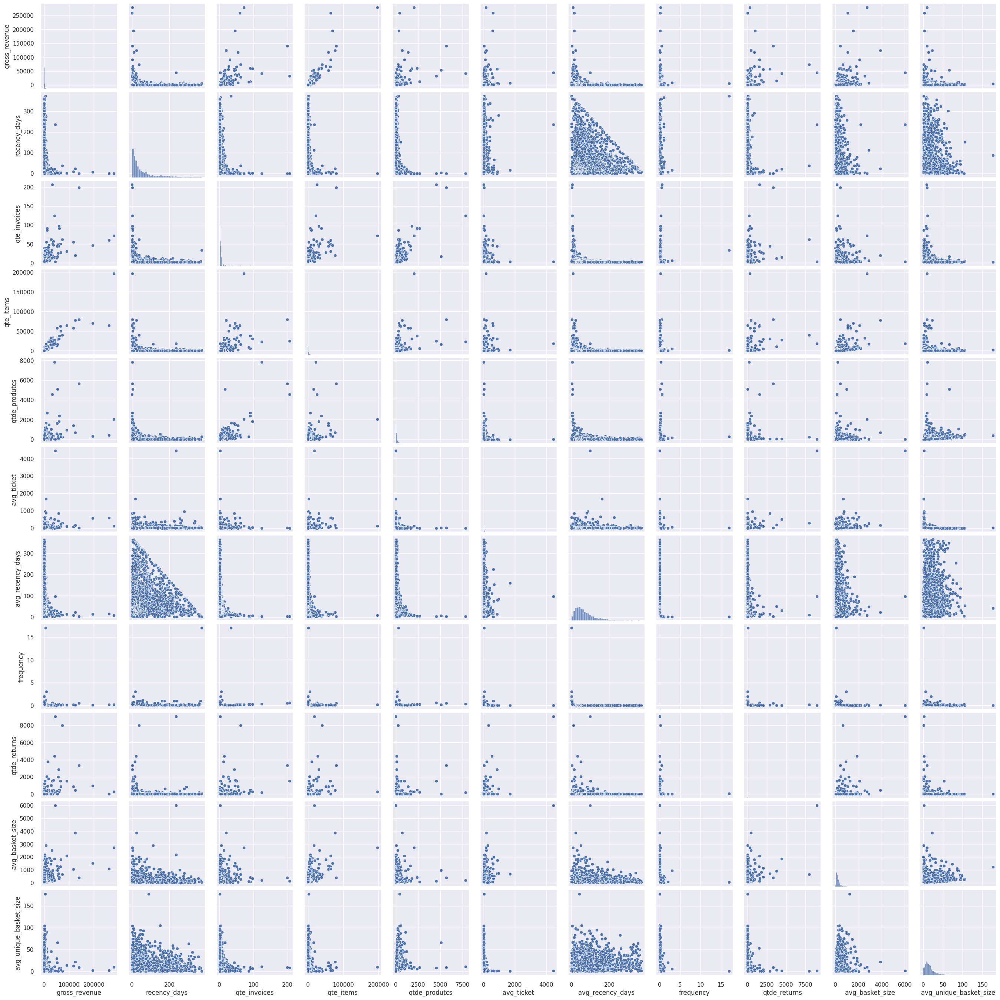

In [62]:
plt.figure( figsize=(25,12) )
sns.pairplot(df42)

**Anotações**
1. frequency has low variance
2. Agt Ticket has low variance

## 4.3. Estudo do Espaço

In [86]:
# DataSet Original
#df43 = df4.drop( columns=['customer_id'], axis=1 ).copy()

# Selected Dataset - (Ciclo 06)
cols_selected = ['customer_id', 'gross_revenue', 'recency_days', 'qtde_produtcs', 'frequency', 'qtde_returns']
df43 = df4[cols_selected].copy()

In [87]:
df43.columns

Index(['customer_id', 'gross_revenue', 'recency_days', 'qtde_produtcs',
       'frequency', 'qtde_returns'],
      dtype='object')

In [88]:
mm = pp.MinMaxScaler()

#
df43['gross_revenue'] = mm.fit_transform( df43[['gross_revenue']] )
df43['recency_days'] = mm.fit_transform( df43[['recency_days']] )
#df43['qte_invoices'] = mm.fit_transform( df43[['qte_invoices']] )
#df43['qte_items'] = mm.fit_transform( df43[['qte_items']] )
df43['qtde_produtcs'] = mm.fit_transform( df43[['qtde_produtcs']] )
#df43['avg_ticket'] = mm.fit_transform( df43[['avg_ticket']] )
#df43['avg_recency_days'] = mm.fit_transform( df43[['avg_recency_days']] )
df43['frequency'] = mm.fit_transform( df43[['frequency']] )
df43['qtde_returns'] = mm.fit_transform( df43[['qtde_returns']] )
#df43['avg_basket_size'] = mm.fit_transform( df43[['avg_basket_size']] )
#df43['avg_unique_basket_size'] = mm.fit_transform( df43[['avg_unique_basket_size']] )

X = df43.copy()

### 4.3.1. PCA

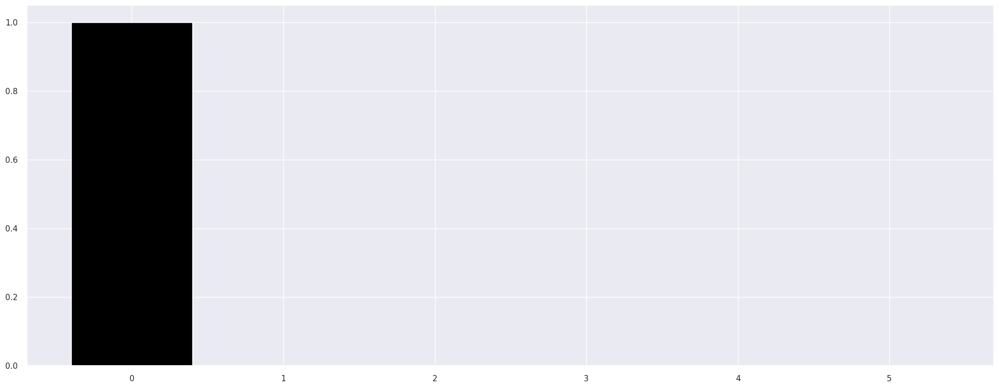

In [89]:
pca = dd.PCA ( n_components= X.shape[1] )

principal_components = pca.fit_transform ( X )

#plot Explained variable
features = range( pca.n_components_ )

plt.bar( features, pca.explained_variance_ratio_, color='black')

# pca component
df_pca = pd.DataFrame( principal_components )

<Axes: xlabel='0', ylabel='1'>

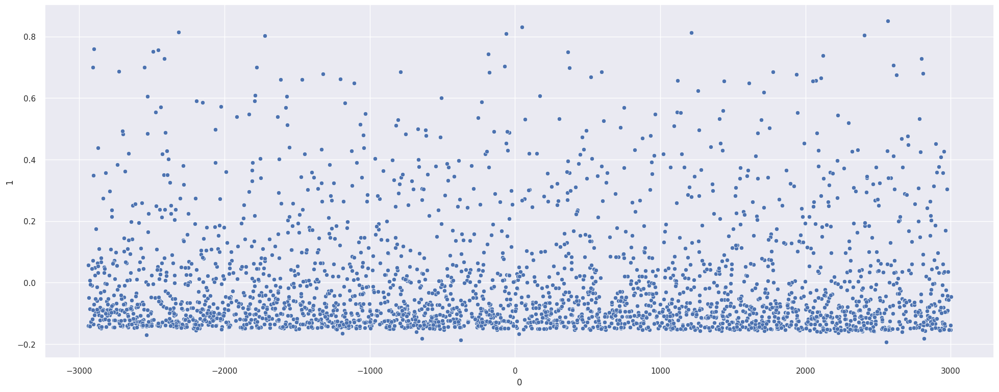

In [90]:
sns.scatterplot ( x=0, y=1, data=df_pca)

### 4.3.2. UMAP

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

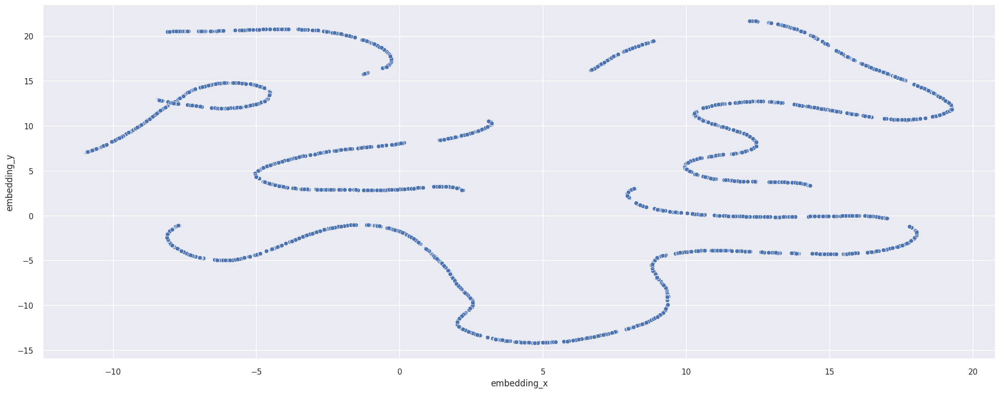

In [91]:
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

#plot
sns.scatterplot( x='embedding_x', y='embedding_y',
                data=df_pca)

### 4.3.3. t-SNE

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

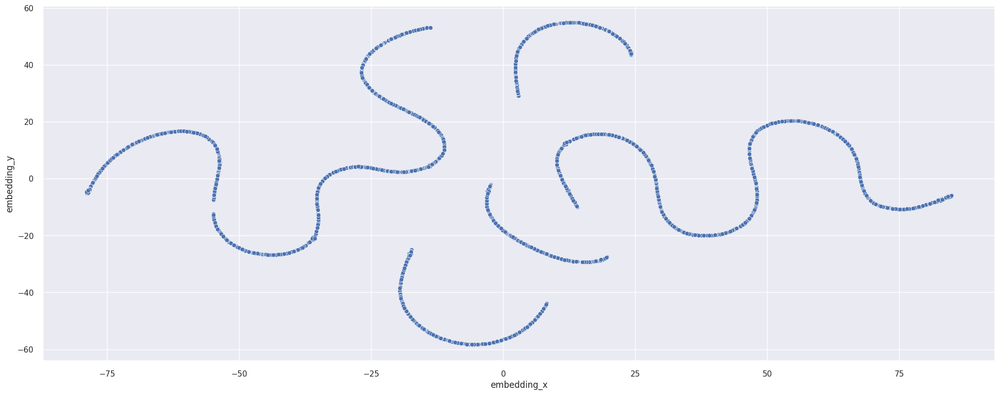

In [92]:
reducer = TSNE( n_components=2, n_jobs=-1,random_state=42 )
embedding = reducer.fit_transform( X )

# embedding
df_pca['embedding_x'] = embedding[:, 0]
df_pca['embedding_y'] = embedding[:, 1]

#plot
sns.scatterplot( x='embedding_x', y='embedding_y',
                data=df_pca)

### 4.3.4. Tree-Based Embedding

In [93]:
# training dataset
X = df4.drop( columns=['customer_id', 'gross_revenue'], axis=1)
y = df4['gross_revenue']

# model definition
rf_model = en.RandomForestRegressor(n_estimators=100, random_state=42)

# model training
rf_model.fit( X, y )

# Leaf

# dataframe Leaf

RandomForestRegressor(random_state=42)

In [94]:
df_leaf = pd.DataFrame( rf_model.apply( X ) )

In [95]:
df_leaf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99
0,2646,2881,3092,2917,2627,2907,2918,3073,2743,3066,3104,2919,2932,2954,2513,2916,2936,2924,2878,2935,2555,2865,2873,3099,2857,3080,2973,2737,2872,3009,2886,3064,3072,2858,3029,2937,3136,2772,2691,3002,2932,2813,2904,2858,2839,2904,2882,3122,2970,2871,2909,2942,2806,3070,2896,3059,2932,2945,2822,2840,3028,3058,2677,2880,2852,2899,2759,2865,3046,2925,2558,2834,3210,2836,2864,3027,3073,2873,2972,3020,2702,2553,2845,2829,2013,3102,2921,2989,2691,2882,2701,2753,2719,2868,2727,2997,2915,2915,3030,2777
1,2572,2774,2711,2891,2498,2891,2714,2703,2925,2700,2744,2586,2857,2907,2511,2876,2822,2812,2701,2598,2706,2824,2693,2697,2781,2334,2648,2668,2842,2619,2741,2710,2683,2820,2675,2552,2875,2752,2629,2878,2620,2794,2887,2888,2814,2592,2815,2394,2612,2824,2465,2856,2743,2653,2811,2749,2895,2918,2627,2615,2620,2660,2657,2859,2835,2872,2742,2854,2600,2899,2540,2632,2779,2824,2481,3062,2757,2569,2885,2594,2855,2901,2835,2810,2772,2746,2895,2938,2656,2849,2647,2549,2709,2807,2712,2601,2853,2859,2691,2752
2,3422,3382,3311,3375,3334,3417,3244,3294,3409,3333,3404,3285,3396,3445,3344,3263,3348,3381,3363,3196,3402,3354,3289,3299,3334,3393,3282,3219,3290,3422,3323,3423,3403,3356,3361,3369,3374,3348,3323,3290,3205,3328,3276,3277,3348,3245,3274,3396,3400,3358,3366,3393,3314,3343,3393,3261,3356,3396,3301,3369,3388,3338,3311,3415,3279,3401,3412,3342,3402,3365,3277,3367,3340,3353,3363,3314,3392,3358,3450,3202,3266,3333,3367,3342,3320,3417,3377,3390,3288,3360,3318,3309,3308,3293,3287,3418,3339,3305,3313,3401
3,1610,913,1082,1134,1804,1827,1492,1445,1252,1281,1879,1625,1767,1711,2098,1165,1985,1295,1368,1752,1848,1547,1482,1890,1662,1242,1294,1245,1342,1952,1527,1832,1182,1384,786,1951,1628,1216,1063,1481,1134,1186,1495,1462,1587,1230,1617,1182,1525,1098,1593,1336,1231,1606,1678,1219,1818,1609,1304,1273,1290,1339,1178,1618,1516,1268,1251,1272,1763,1637,1578,1643,1528,1181,1539,1328,1606,1381,1811,1227,1901,1432,1104,1215,1785,1746,1595,1451,1157,1737,1142,1950,1737,1301,1522,1222,1600,1683,1901,1753
4,602,713,575,445,551,562,548,468,567,426,513,563,534,484,523,113,145,450,627,559,579,471,452,526,533,709,680,448,227,559,429,570,317,438,265,441,448,730,476,477,632,614,495,454,477,522,522,590,461,596,548,536,547,560,455,573,624,467,130,677,563,484,739,498,569,668,151,459,476,492,380,538,513,625,374,49,456,554,504,548,530,436,590,824,563,445,474,452,762,462,575,455,419,512,438,536,477,408,552,465


<Axes: xlabel='embedding_x', ylabel='embedding_y'>

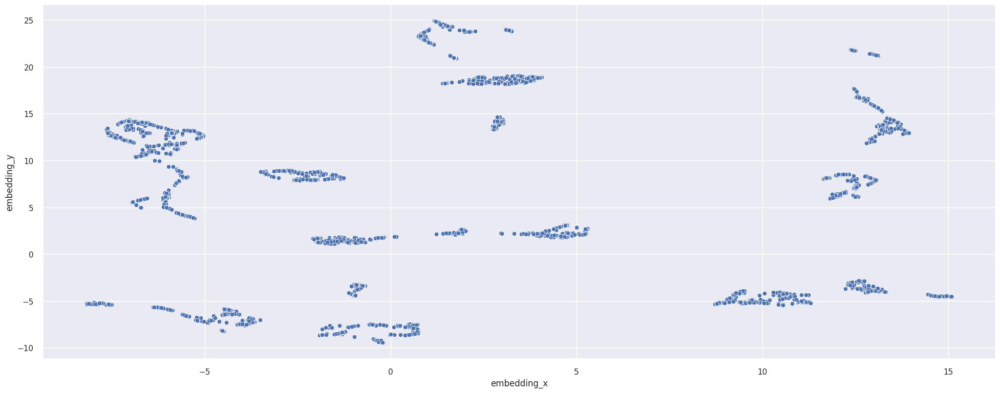

In [96]:
# reduzindo a dimensionalidade
reducer = umap.UMAP( random_state=42 )
embedding = reducer.fit_transform( df_leaf )

# embedding
df_tree = pd.DataFrame()
df_tree['embedding_x'] = embedding[:, 0]
df_tree['embedding_y'] = embedding[:, 1]

#plot
sns.scatterplot( x='embedding_x', y='embedding_y',
                data=df_tree)

# <font color='red'>5.0. Data Preparation</font>

Padronização (Standardization) -> Premissa de que os dados vieram de uma distribuição normal.

Rescala      (Rescale)         -> Não Premissa de que os dados vieram de uma distribuição normal.


**Regra que podem ajudar**
1. Distribuição Normal e não possui Outlier -> Standard Scaler - Média e desvio padrão
2. Distribuição Normal e possuí Outlier -> Robust Scaler - Quartis
3. Não distribuição Normal -> Min Max Scaler

In [97]:
#**Testes de Normalidade**
#QQ Plot - Quantile Quantile Plot (Quantile teorico x Quantile real)
#KS Test - Kolgomorov Smirnoff (Teste de Hipótese) Se p-value > 0.5 -> Distribuição Normal, p-value < 0.5 -> Não distribuição Normal
#
#**Detecção Outielr**
#Box Plot -> Pontos são identificados como Outliers
#IRQ * 2.5 -> Acima desse valor (Outielr)
#
#-Z-Score > 3 ou Z-Score < -3  -> Outliers

In [98]:
#df5 = df4.copy()
df5 = df_tree.copy()
#df5_aux = df4.copy()

In [99]:
df5.columns

Index(['embedding_x', 'embedding_y'], dtype='object')

In [100]:
#
#ss = pp.StandardScaler()
#rs = pp.RobustScaler()
#
#mm_gross_revenue = pp.MinMaxScaler()
#df5['gross_revenue'] = mm_gross_revenue.fit_transform( df5[['gross_revenue']])
#
#mm_recency_days = pp.MinMaxScaler()
#df5['recency_days'] = mm_recency_days.fit_transform( df5[['recency_days']])
#
##df5['qte_invoices'] = mm.fit_transform( df5[['qte_invoices']])
#
##df5['qte_items'] = mm.fit_transform( df5[['qte_items']])
#
#mm_qtde_produtcs = pp.MinMaxScaler()
#df5['qtde_produtcs'] = mm_qtde_produtcs.fit_transform( df5[['qtde_produtcs']])
#
##df5['avg_ticket'] = mm.fit_transform( df5[['avg_ticket']])
#
##df5['avg_recency_days'] = mm.fit_transform( df5[['avg_recency_days']])
#
#mm_frequency = pp.MinMaxScaler()
#df5['frequency'] = mm.fit_transform( df5[['frequency']])
#
#df5['qtde_returns'] = mm.fit_transform( df5[['qtde_returns']])
#
##df5['avg_basket_size'] = mm.fit_transform( df5[['avg_basket_size']])
#
##df5['avg_unique_basket_size'] = mm.fit_transform( df5[['avg_unique_basket_size']])
#
##variable = 'avg_unique_basket_size'

In [101]:
## Dados AS IS
#print(f'Min:{df5_aux[variable].min()} - Max:{df5_aux[variable].max()}')
#sns.displot(df5_aux[variable]);

In [102]:
## Dados Normalizados / Rescalados
#print(f'Min:{df5[variable].min()} - Max:{df5[variable].max()}')
#sns.displot(df5[variable]);

In [103]:
#sns.boxplot( df5_aux[variable] );

In [104]:
df5.head()

,embedding_x,embedding_y
0,14.794774,-4.444558
1,10.938190,-5.061398
2,13.117279,15.574352
3,-6.928566,5.588614
4,1.398701,18.229527


# <font color='red'>6.0. Feature Selection</font>

In [105]:
#cols_selected = ['customer_id', 'gross_revenue', 'recency_days', 'qtde_produtcs', 'frequency', 'qtde_returns']

In [106]:
#df6 = df5[cols_selected].copy()
df6 = df_tree.copy()

# <font color='red'>7.0. Hyperparameter Fine-Tunning</font>

In [107]:
#X = df6.drop( columns=['customer_id'])
X = df_tree.copy()

In [108]:
X.head()

,embedding_x,embedding_y
0,14.794774,-4.444558
1,10.938190,-5.061398
2,13.117279,15.574352
3,-6.928566,5.588614
4,1.398701,18.229527


In [109]:
#clusters = [2, 3, 4, 5, 6, 7, 8, 9]
clusters = np.arange( 2, 25, 1)

## 7.1. K-Means

In [110]:
kmeans_list = []
for k in clusters:
    # model definition
    kmeans_model = c.KMeans( n_clusters=k )
    
    # model training
    kmeans_model.fit( X )
    
    # model predict
    labels = kmeans_model.predict( X )
    
    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean')
    kmeans_list.append( sil )

Text(0.5, 1.0, 'Silhouette Score x K')

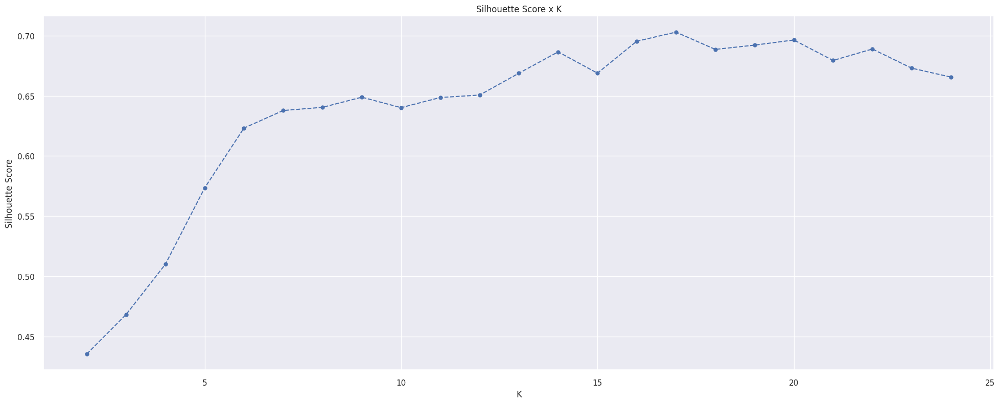

In [111]:
plt.plot(clusters, kmeans_list, linestyle='--', marker='o', color='b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score');
plt.title( 'Silhouette Score x K' )

## 7.2. GMM

In [112]:
gmm_list = []
for k in clusters:
    # model definition
    gmm_model = mx.GaussianMixture( n_components=k )
    
    # model training
    gmm_model.fit( X )
    
    # model predict
    labels = gmm_model.predict( X )
    
    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean')
    gmm_list.append( sil )

Text(0.5, 1.0, 'Silhouette Score x K')

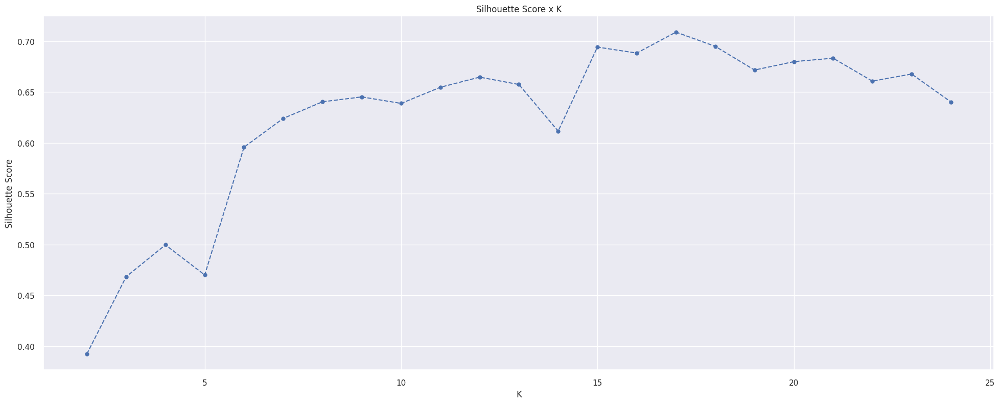

In [113]:
plt.plot(clusters, gmm_list, linestyle='--', marker='o', color='b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score');
plt.title( 'Silhouette Score x K' )

## 7.3. Hierarchical Clustering

In [114]:
# model definition and training
hc_model = hc.linkage(X, 'ward' )

In [115]:
#hc.dendrogram(
#    hc_model,
#    leaf_rotation=90,
#    leaf_font_size=8
#)
#
#plt.plot()

In [116]:
#hc.dendrogram(
#    hc_model,
#    truncate_mode='lastp',
#    p=12,
#    leaf_rotation=90,
#    leaf_font_size=8,
#    show_contracted=True
#)
#
#plt.plot()

### 7.3.1. HClustering Silhouette Score

In [117]:
hc_list = []
for k in clusters:
    # model definition & training
    hc_model = hc.linkage( X, 'ward' )
    
    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )
    
    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean')
    hc_list.append( sil )

Text(0.5, 1.0, 'Silhouette Score x K')

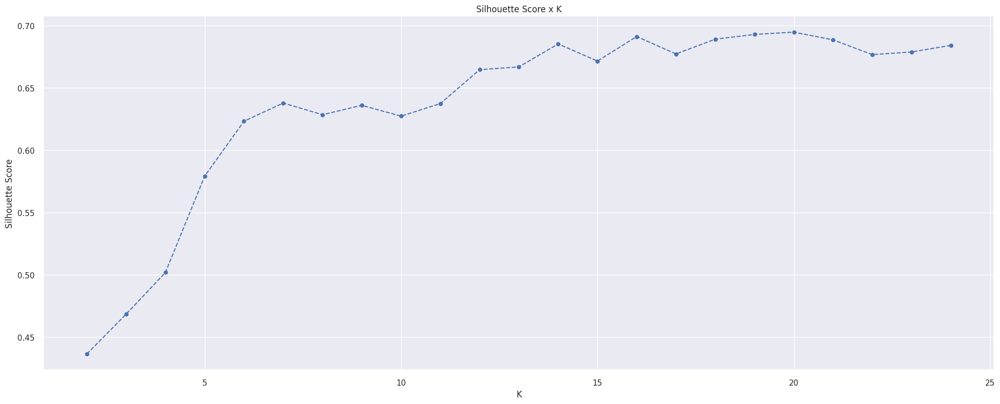

In [118]:
plt.plot(clusters, hc_list, linestyle='--', marker='o', color='b')
plt.xlabel( 'K' );
plt.ylabel( 'Silhouette Score');
plt.title( 'Silhouette Score x K' )

## 7.4. DBSCAN

In [119]:
eps = 2.0
min_samples = 20

# model definition
dbscan_model = c.DBSCAN( eps=eps, min_samples=min_samples )

# model training & predict
labels = dbscan_model.fit_predict( X )

# model performance
sil = m.silhouette_score( X, labels, metric='euclidean')
print(f'Silhouette Score: {sil}')
print(f'Numero de Clusters: {len(unique(labels))}')
print(unique( labels ))

Silhouette Score: 0.5615350008010864
Numero de Clusters: 12
[ 0  1  2  3  4  5  6  7  8  9 10 11]


In [120]:
neighbors = NearestNeighbors( n_neighbors=min_samples ).fit( X )
distance, indices = neighbors.kneighbors( X )

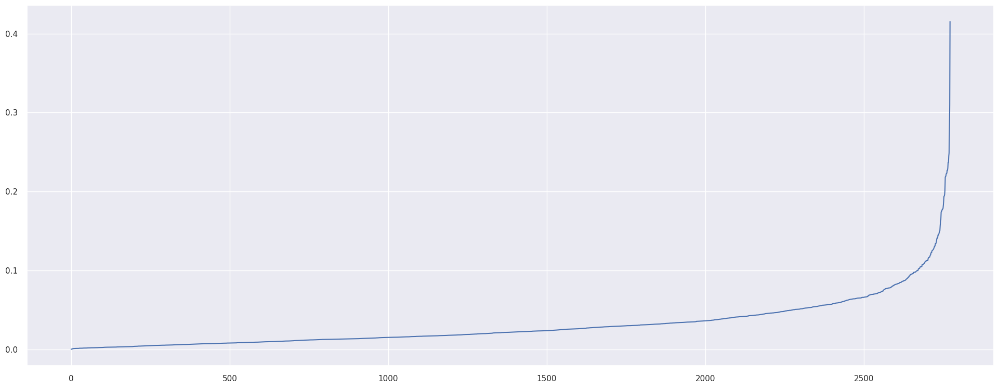

In [121]:
distance = np.sort( distance, axis=0 )
distance = distance[:,1]
plt.plot( distance )

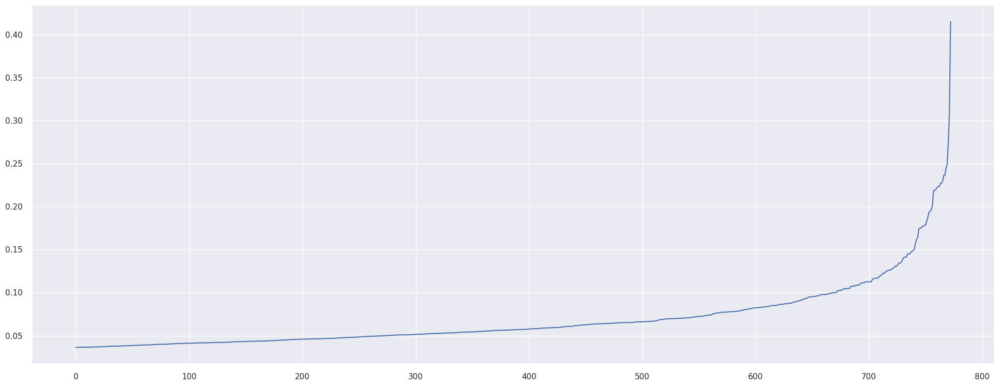

In [122]:
plt.plot( distance[2000:] )

## 7.5. Results

In [124]:
# Model Name | k=2 | k=3 | k=4 | k=5 | ...
#   K-means    SS    SS    SS    SS
#   GMM        SS    SS    SS    SS
#   HC         SS    SS    SS    SS
#   DBSCAN     SS    SS    SS    SS

df_results = pd.DataFrame(
    {'Kmeans': kmeans_list,
     'GMM': gmm_list,
     'HC': hc_list}
).T

df_results.columns = clusters
df_results.style.highlight_max( color='lightgreen', axis=1)

,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
Kmeans,0.435510,0.468326,0.510096,0.573566,0.623261,0.637856,0.640495,0.648926,0.640222,0.648682,0.650692,0.668854,0.686606,0.668891,0.695442,0.703015,0.688658,0.692194,0.696463,0.679461,0.688971,0.673054,0.665626
GMM,0.392407,0.468326,0.499630,0.470048,0.595695,0.624040,0.640383,0.645193,0.638784,0.654658,0.664635,0.657385,0.611495,0.694197,0.688284,0.708904,0.694896,0.671590,0.679868,0.683279,0.660676,0.667664,0.640249
HC,0.436375,0.468326,0.501779,0.579187,0.623261,0.637856,0.628481,0.636034,0.627330,0.637453,0.664648,0.666898,0.685330,0.671592,0.691234,0.677312,0.689147,0.692981,0.694822,0.688567,0.676765,0.678870,0.684214


## 7.6. Silhouette Analysis

Para k =2, Silhouette Score 0.4363754093647003
Para k =3, Silhouette Score 0.4683258533477783
Para k =4, Silhouette Score 0.5017786026000977
Para k =5, Silhouette Score 0.5791873335838318
Para k =6, Silhouette Score 0.6232609152793884
Para k =7, Silhouette Score 0.6378558874130249


IndexError: index 3 is out of bounds for axis 0 with size 3

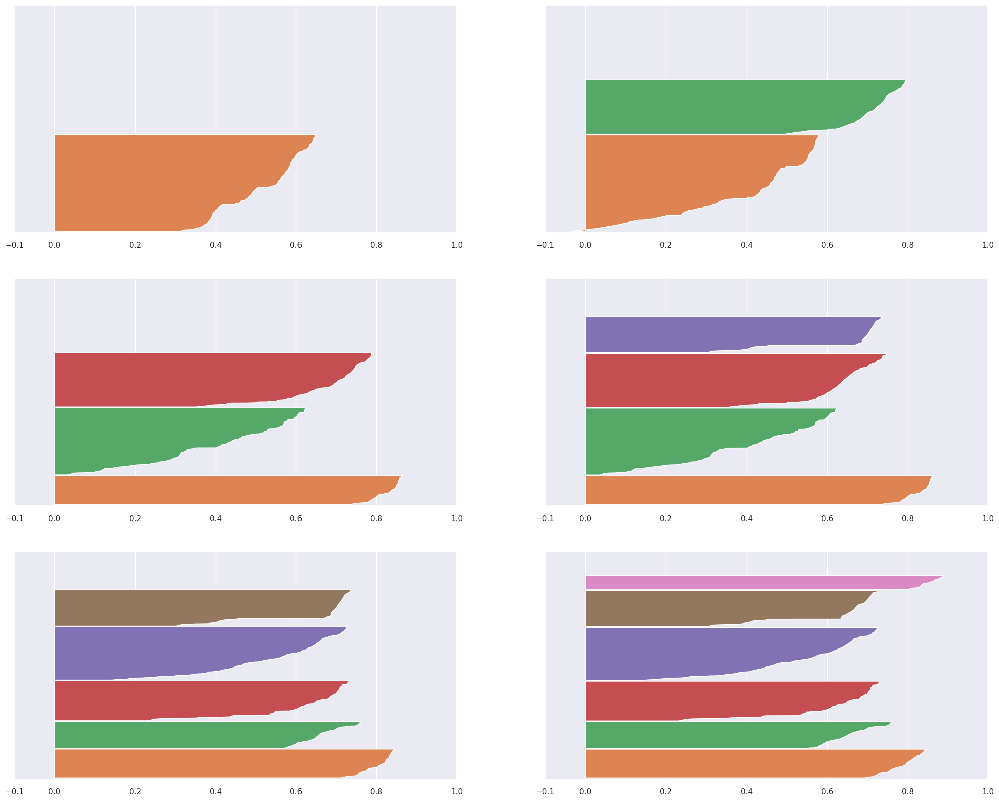

In [125]:
fig, ax = plt.subplots( 3, 2 )
fig.set_size_inches( 25, 20 )

for k in clusters:
    q, mod = divmod( k, 2 )

    ax[q-1, mod].set_xlim( [ -0.1, 1 ])
    ax[q-1, mod].set_ylim( [ 0, len( X ) + ( k+1)*10] )
    
    
    # model definition & training
    hc_model = hc.linkage( X, 'ward' )
    
    # model predict
    labels = hc.fcluster( hc_model, k, criterion='maxclust' )
    
    # model performance
    sil = m.silhouette_score( X, labels, metric='euclidean')
    print(f'Para k ={k}, Silhouette Score {sil}')
    
    sample_ss_values= m.silhouette_samples( X, labels)
    y_lower = 10
    
    for i in range ( k ):
                
        # select cluster
        ith_samples_ss_values = sample_ss_values[labels == i] 

        # ordenação cluster
        ith_samples_ss_values.sort()
        
        # tamanho do cluster
        size_cluster_i = ith_samples_ss_values.shape[0]
        y_upper = y_lower + size_cluster_i

        cmap = cm.get_cmap( 'Spectral' )
        color = cmap( i / k )
              
        ax[q-1, mod].fill_betweenx(np.arange(y_lower, y_upper ), 0, ith_samples_ss_values )
        y_lower = y_upper + 10

    ax[q-1, mod].set_yticks([])
    ax[q-1, mod].set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

# <font color='red'>8.0. Model Training</font>

## 8.1. K-Means

In [132]:
## model definition
#k = 11
#kmeans = c.KMeans( init='random', n_clusters=k, n_init=10, max_iter=300, random_state=42 )
#
## model training
#kmeans.fit( X )
#
## clustering
#labels = kmeans.labels_

## 8.2. GMM

In [166]:
k = 8
# model definition
kmeans = mx.GaussianMixture( n_components=k )

# model training
kmeans.fit( X )

# model predict
labels = kmeans.predict( X )

### 8.1.0. Cluster Validation

In [167]:
# WSS (Within-Cluster Sum of Square)
#print( f'WSS value: {kmeans.inertia_}')

# SS (Silhouette Score)
print( f'SS value: {m.silhouette_score( X, labels, metric="euclidean" )}' )

SS value: 0.6403827667236328


# <font color='red'>9.0. Cluster Analysis</font>

In [178]:
df9 = X.copy()
df9['cluster'] = labels

## 9.1. Visualization Inspection

<Axes: xlabel='embedding_x', ylabel='embedding_y'>

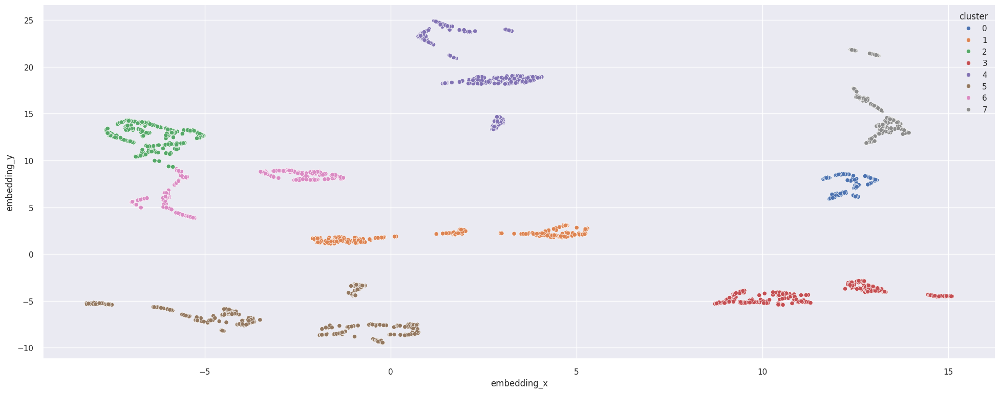

In [179]:
sns.scatterplot(x='embedding_x', y='embedding_y', hue='cluster', data=df9, palette='deep')

In [171]:
#visualizer = SilhouetteVisualizer( kmeans, colors='yellowbrick' )
#visualizer.fit( X )
#visualizer.finalize()

### 9.1.1 2d plot

In [174]:
#df9.head()

In [175]:
#df_viz = df9.drop( columns='customer_id', axis=1 )
#sns.pairplot( df_viz, hue='cluster' )

### 9.1.2 UMAP

In [176]:
#reducer = umap.UMAP( n_neighbors=90, random_state=42 )
#embedding = reducer.fit_transform( X )
#
## embedding
#df_viz['embedding_x'] = embedding[:, 0]
#df_viz['embedding_y'] = embedding[:, 1]
#
##plot
#sns.scatterplot( x='embedding_x', y='embedding_y',
#               hue='cluster', palette=sns.color_palette( 'hls', n_colors=len(df_viz['cluster'].unique()) ),
#               data=df_viz)

## 9.1. Visualization Inspection

In [36]:
# Visualização para até 3 dimenções
#fig = px.scatter_3d( df9, x='recency_days', y='invoice_no', z='gross_revenue', color='cluster' )
#fig.show()

## 9.2. Cluster Profile

In [186]:
df92 = df4[ cols_selected].copy()
df92['cluster'] = labels
df92.head()

,customer_id,gross_revenue,recency_days,qtde_produtcs,frequency,qtde_returns,cluster
0,17850,5391.21,372.0,297.0,17.000000,40.0,3
1,13047,3232.59,56.0,171.0,0.028302,35.0,3
2,12583,6705.38,2.0,232.0,0.040323,50.0,7
3,13748,948.25,95.0,28.0,0.017921,0.0,6
4,15100,876.00,333.0,3.0,0.073171,22.0,4


In [189]:
# Number of customer
df_cluster = df92[['customer_id', 'cluster']].groupby( 'cluster' ).count().reset_index()
df_cluster['perc_customer'] = 100 * ( df_cluster['customer_id'] / df_cluster['customer_id'].sum() )

# AVG gross_revenue
df_avg_gross_revenue = df92[['gross_revenue', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_gross_revenue, how='inner', on='cluster')

# AVG recency_days
df_avg_recency_days = df92[['recency_days', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_avg_recency_days, how='inner', on='cluster')

# AVG qtde_produtcs
df_qtde_produtcs = df92[['qtde_produtcs', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_qtde_produtcs, how='inner', on='cluster')

# AVG frequency
df_frequency = df92[['frequency', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_frequency, how='inner', on='cluster')

# AVG qtde_returns
df_qtde_returns = df92[['qtde_returns', 'cluster']].groupby ('cluster').mean().reset_index()
df_cluster = pd.merge( df_cluster, df_qtde_returns, how='inner', on='cluster')

df_cluster.sort_values(by='gross_revenue', ascending=False)


,cluster,customer_id,perc_customer,gross_revenue,recency_days,qtde_produtcs,frequency,qtde_returns
7,7,287,10.349802,15257.986690,20.174216,438.794425,0.075166,228.351916
0,0,177,6.382979,3905.311808,27.050847,230.627119,0.036717,35.966102
3,3,362,13.054454,2603.633867,39.348066,163.176796,0.078079,23.096685
5,5,494,17.814641,1719.687085,40.639676,115.461538,0.031375,17.421053
1,1,336,12.116841,1065.820893,64.654762,73.574405,0.043797,10.767857
6,6,335,12.080779,873.529821,67.026866,65.513433,0.038518,6.340299
2,2,333,12.008655,610.047778,78.057057,53.387387,0.048628,3.165165
4,4,449,16.191850,384.870334,93.579065,27.928731,0.049417,2.930958


### Cluster 01:
    - Número de customers: 6 (0,14% do custormers)
    - Recência em média: 7 dias
    - Compra em média: 89 compras
    - Ticket em média: $253,63 dolares
- Receita em média: $182.181,98 dolares

### Cluster 02:
    - Número de customers: 28 (0,64% do custormers)
    - Recência em média: 6 dias
    - Compra em média: 58 compras
    - Ticket em média: $162,86 dolares
- Receita em média: $42.614,39 dolares

### Cluster 03:
    - Número de customers: 267 (6% do custormers)
    - Recência em média: 20 dias
    - Compra em média: 19 compras
    - Ticket em média: $62,78 dolares
- Receita em média: $8.089,03 dolares

### Cluster 04:
    - Número de customers: 4.071 (93% do custormers)
    - Recência em média: 96 dias
    - Compra em média: 3 compras
    - Ticket em média: $25,36 dolares
- Receita em média: $946,70 dolares

# <font color='red'>10.0. Análise Exploratoria de Dados</font>

## 10.1. MindMAp de hipóteses

## 10.2. Hipóteses de Negócio

## 10.3. Priorização das Hipóteses

## 10.4. Validação das Hipóteses

## 10.5. Quadro de Respostas 

# <font color='red'>11.0. Deploy To Production</font>